# Set-up

In [163]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
import folium
from folium import plugins
from folium.plugins import HeatMap
from shapely.geometry import Point
import re

``` 
├── data
│   ├── basico
│   ├── domicilio
│   └── pessoa
└── sharp
    ├── al
    ├── ba
    ├── ce
    ├── df
    ├── es
    ├── go
    ├── mg
    ├── ms
    ├── mt
    ├── pe
    ├── pr
    ├── rj
    ├── rn
    ├── rs
    ├── sc
    └── sp
```

In [145]:
os.listdir('data/pessoa')

['dados_censitarios_consolidados_pessoa_renda.csv',
 'PessoaRenda_MS.csv',
 'PessoaRenda_DF.csv',
 'PessoaRenda_MG.csv',
 'PessoaRenda_PE.csv',
 'PessoaRenda_BA.csv',
 'PessoaRenda_GO.csv',
 'PessoaRenda_PR.csv',
 'PessoaRenda_RN.csv',
 'PessoaRenda_AL.csv',
 'PessoaRenda_CE.csv',
 'PessoaRenda_RJ.csv',
 'PessoaRenda_RS.csv',
 'PessoaRenda_ES.csv',
 'PessoaRenda_MT.csv',
 'PessoaRenda_SP2.csv',
 'PessoaRenda_SC.csv',
 'PessoaRenda_SP1.csv']

# data basico

![basico_I](img/basico_I.png) ![basico_II](img/basico_II.png)

## Info importante

- setor censitário: es la unidad territorial más pequeña. ```<UF><MMMMM><DD><SD><SSSS>```
- pagina con la informacion espacial (layers) https://censo2010.ibge.gov.br/sinopseporsetores/?nivel=mn
- http://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_de_setores_censitarios__divisoes_intramunicipais/censo_2010/setores_censitarios_shp/
- https://medium.com/creditas-tech/incrementando-dados-geogr%C3%A1ficos-com-o-censo-nacional-do-ibge-54d342c4bdcf

## Variable potencialmente relevantes:

- V005: Ingreso
- V006: Varianción del ingreso 
- V007: Ingreso de las personas responsables del hogar
- V008: Variación del ingreso de las personas responsables del hogar

In [213]:
data_censitarios_basico = pd.read_csv('data/basico/dados_censitarios_consolidados.csv', dtype='str')

In [91]:
print(data_censitarios_basico.info())
data_censitarios_basico.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265857 entries, 0 to 265856
Data columns (total 36 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   Unnamed: 0           265857 non-null  object
 1   Unnamed: 0.1         265857 non-null  object
 2   Cod_Grandes Regiões  265857 non-null  object
 3   Cod_RM               265857 non-null  object
 4   Cod_UF               265857 non-null  object
 5   Cod_bairro           265857 non-null  object
 6   Cod_distrito         265857 non-null  object
 7   Cod_meso             265857 non-null  object
 8   Cod_micro            265857 non-null  object
 9   Cod_municipio        265857 non-null  object
 10  Cod_setor            265857 non-null  object
 11  Cod_subdistrito      265857 non-null  object
 12  Nome_Grande_Regiao   265857 non-null  object
 13  Nome_da_RM           265857 non-null  object
 14  Nome_da_UF           265857 non-null  object
 15  Nome_da_meso         265857 non-nu

,Unnamed: 0,Unnamed: 0.1,Cod_Grandes Regiões,Cod_RM,Cod_UF,Cod_bairro,Cod_distrito,Cod_meso,Cod_micro,Cod_municipio,...,BASICO_V003,BASICO_V004,BASICO_V005,BASICO_V006,BASICO_V007,BASICO_V008,BASICO_V009,BASICO_V010,BASICO_V011,BASICO_V012
0,0,0,3,0,SP,3500105000,350010505,3508,35035,3500105,...,"2,04","1,11","2103,64","4968912,37","2191,9","4984036,79","1530,51","4163648,03","1901,54","4468808,1"
1,1,1,3,0,SP,3500105000,350010505,3508,35035,3500105,...,"2,67","1,77","1899,91","3969367,45","1980,76","3978169,48","1180,37","2621328,25","1572,39","2875973,5"
2,2,2,3,0,SP,3500105000,350010505,3508,35035,3500105,...,"2,43","1,33","3170,82","14377539,93","3246,68","14475686,47","1908,64","10014924,33","2536,42",11721183
3,3,3,3,0,SP,3500105000,350010505,3508,35035,3500105,...,"2,74","1,85","2782,6","12624098,34","2882,7","12790260,49","1583,46","7209788,84","2141,47","8558034,75"
4,4,4,3,0,SP,3500105000,350010505,3508,35035,3500105,...,"2,79","1,85","2050,27","101395096,1","2455,27",120508046,"1423,52","40900639,93","1908,13","53922664,72"


# data domicilio

![domicilios_I](img/domicilios_I.png) 

In [201]:
data_censitarios_domicilios = pd.read_csv('data/domicilio/dados_censitarios_consolidados_domicilio_renda.csv', dtype='str')

In [202]:
print(data_censitarios_domicilios.info())
data_censitarios_domicilios.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265857 entries, 0 to 265856
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Unnamed: 0            265857 non-null  object
 1   Cod_setor             265857 non-null  object
 2   Situacao_setor        265857 non-null  object
 3   DOMICILIO_RENDA_V001  265857 non-null  object
 4   DOMICILIO_RENDA_V002  265857 non-null  object
 5   DOMICILIO_RENDA_V003  265857 non-null  object
 6   DOMICILIO_RENDA_V004  265857 non-null  object
 7   DOMICILIO_RENDA_V005  265857 non-null  object
 8   DOMICILIO_RENDA_V006  265857 non-null  object
 9   DOMICILIO_RENDA_V007  265857 non-null  object
 10  DOMICILIO_RENDA_V008  265857 non-null  object
 11  DOMICILIO_RENDA_V009  265857 non-null  object
 12  DOMICILIO_RENDA_V010  265857 non-null  object
 13  DOMICILIO_RENDA_V011  265857 non-null  object
 14  DOMICILIO_RENDA_V012  265857 non-null  object
 15  DOMICILIO_RENDA_V

,Unnamed: 0,Cod_setor,Situacao_setor,DOMICILIO_RENDA_V001,DOMICILIO_RENDA_V002,DOMICILIO_RENDA_V003,DOMICILIO_RENDA_V004,DOMICILIO_RENDA_V005,DOMICILIO_RENDA_V006,DOMICILIO_RENDA_V007,DOMICILIO_RENDA_V008,DOMICILIO_RENDA_V009,DOMICILIO_RENDA_V010,DOMICILIO_RENDA_V011,DOMICILIO_RENDA_V012,DOMICILIO_RENDA_V013,DOMICILIO_RENDA_V014,Unnamed: 16
0,0,355030801000001,1,2,907777,903817,3960,0,0,14,51,94,49,42,12,5,1,NaN
1,1,355030801000002,1,0,846525,846525,0,0,2,28,87,94,45,30,12,4,4,NaN
2,2,355030801000003,1,0,505662,505662,0,0,3,11,38,50,19,16,10,3,39,NaN
3,3,355030801000004,1,0,446011,446011,0,0,3,8,39,57,14,14,9,1,36,NaN
4,4,355030801000005,1,0,615215,615215,0,0,2,20,68,76,37,18,8,3,8,NaN


# data pessoa

In [147]:
data_censitarios_pessoa = pd.read_csv('data/pessoa/dados_censitarios_consolidados_pessoa_renda.csv', dtype='str')

In [148]:
print(data_censitarios_pessoa.info())
data_censitarios_pessoa.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265857 entries, 0 to 265856
Columns: 136 entries, Unnamed: 0 to Unnamed: 134
dtypes: object(136)
memory usage: 275.9+ MB
None


,Unnamed: 0,Cod_setor,Situacao_setor,PESSOA_RENDA_V001,PESSOA_RENDA_V002,PESSOA_RENDA_V003,PESSOA_RENDA_V004,PESSOA_RENDA_V005,PESSOA_RENDA_V006,PESSOA_RENDA_V007,...,PESSOA_RENDA_V124,PESSOA_RENDA_V125,PESSOA_RENDA_V126,PESSOA_RENDA_V127,PESSOA_RENDA_V128,PESSOA_RENDA_V129,PESSOA_RENDA_V130,PESSOA_RENDA_V131,PESSOA_RENDA_V132,Unnamed: 134
0,0,355030801000001,1,2,93,180,92,82,63,9,...,59930,56750,97100,12000,0,32000,396,266,364621,NaN
1,1,355030801000002,1,6,138,205,85,72,56,4,...,47032,45500,90700,0,16000,23000,446,292,351255,NaN
2,2,355030801000003,1,1,32,102,46,67,19,5,...,27172,57100,35300,6000,16000,0,296,136,197966,NaN
3,3,355030801000004,1,2,24,126,56,41,28,4,...,27900,28800,42700,7500,0,0,265,128,163939,NaN
4,4,355030801000005,1,3,99,168,81,59,35,5,...,35110,45001,46100,13000,0,0,358,220,242746,NaN


In [149]:
# ?corr
# ttest diff en group/ ANOVA

In [221]:
mapa = folium.Map(width=650, 
                  height=500,
                  zoom_start=4,
                  location=[-15, -50]
                 )

folium.GeoJson('countries.json', name='geojson').add_to(mapa)
mapa

In [129]:
#census_sector_gpd = gpd.read_file(
#'shapes/shapes_censo/ac_setores_censitarios/12SEE250GC_SIR.shp'
#)

# Info resultados

In [139]:
data_procesados = pd.read_csv('Copy of registry.csv', dtype='str')

In [140]:
data_procesados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41770 entries, 0 to 41769
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Unnamed: 0        41770 non-null  object
 1   model_decision    41761 non-null  object
 2   analyst_decision  39742 non-null  object
 3   zip_code          41768 non-null  object
 4   concat            41770 non-null  object
 5   coordinates       41757 non-null  object
dtypes: object(6)
memory usage: 1.9+ MB


In [141]:
data_procesados = data_procesados.fillna(value={'model_decision': 'NA_string',
                                               'analyst_decision': 'NA_string'})

In [142]:
data_procesados = data_procesados.dropna(subset=['coordinates']).reset_index(drop=True)
data_procesados['long'] = pd.to_numeric(data_procesados.coordinates.str.split(',', expand=True).loc[:,0].str.replace('\(', ''))
data_procesados['lat'] = pd.to_numeric(data_procesados.coordinates.str.split(',', expand=True).loc[:,1].str.replace('\)', ''))
data_procesados['state'] = data_procesados.concat.apply(lambda row: row.split(',')[-1].lower())

data_procesados = data_procesados.drop(columns=['zip_code', 'concat', 'coordinates', 'Unnamed: 0'])

In [143]:
pd.crosstab(data_procesados.model_decision,
            data_procesados.analyst_decision,
            dropna=False,
            normalize='columns',
           margins=True)*100

analyst_decision,A,NA_string,R,All
model_decision,,,,
A,0.000000,61.470153,0.000000,2.983931
G,95.276558,3.502713,95.579598,90.985942
NA_string,0.000000,0.098668,0.030912,0.021553
R,0.070237,34.681796,0.746302,2.117010
error,4.653205,0.246670,3.643188,3.891563


In [144]:
pd.crosstab(data_procesados.model_decision,
            data_procesados.analyst_decision,
            dropna=False,
            normalize='index',
           margins=True)*100

analyst_decision,A,NA_string,R
model_decision,,,
A,0.000000,100.000000,0.000000
G,42.844735,0.186877,56.968389
NA_string,0.000000,22.222222,77.777778
R,1.357466,79.524887,19.117647
error,48.923077,0.307692,50.769231
All,40.915296,4.854276,54.230428


In [145]:
data_procesados['coordinate_point'] = pd.Series([], dtype='object')
for idx, row in data_procesados.iterrows():
    data_procesados.iloc[idx, 5] = Point(row.long, row.lat)

In [152]:
data_procesados.tail()

,model_decision,analyst_decision,long,lat,state,coordinate_point
41752,G,R,-46.671396,-23.455998,sp,POINT (-46.6713956 -23.455998)
41753,G,A,-46.549967,-23.440976,sp,POINT (-46.54996729999999 -23.4409755)
41754,G,A,-47.543763,-22.380663,sp,POINT (-47.5437628 -22.3806632)
41755,G,A,-46.549657,-23.537900,sp,POINT (-46.5496566 -23.5379004)
41756,G,R,-46.768518,-23.641504,sp,POINT (-46.7685183 -23.6415044)


In [103]:
census_sector_gpd = gpd.read_file('sharp/sp/33SEE250GC_SIR.shp', encoding='latin1')

In [159]:
data_procesados['census_code'] = data_procesados['coordinate_point'][:10].apply(lambda row: census_sector_gpd.loc[census_sector_gpd.contains(row), 'CD_GEOCODI'].values).str[0]

In [162]:
data_procesados.head()

,model_decision,analyst_decision,long,lat,state,coordinate_point,census_code
0,G,A,-45.400420,-23.621552,sp,POINT (-45.40042039999999 -23.6215522),351050005000020
1,G,A,-46.549567,-23.636960,sp,POINT (-46.54956729999999 -23.6369601),354780905000218
2,G,A,-46.900854,-23.602394,sp,POINT (-46.9008539 -23.6023936),351300905000082
3,G,R,-46.663085,-23.712473,sp,POINT (-46.663085 -23.712473),355030858000188
4,A,NA_string,-40.268181,-20.250764,es,POINT (-40.2681806 -20.2507639),NaN


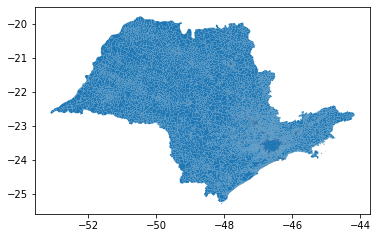

In [164]:
census_sector_gpd.plot()
plt.show()

In [214]:
geolocation_info_with_ibge_df = geolocation_info_df.merge(
    data_censitarios_basico,
    left_on='census_code',
    right_on='Cod_setor',
    how='left'
)

geolocation_info_with_ibge_df

,long,lat,coordinate_point,census_code,Unnamed: 0,Unnamed: 0.1,Cod_Grandes Regiões,Cod_RM,Cod_UF,Cod_bairro,...,BASICO_V003,BASICO_V004,BASICO_V005,BASICO_V006,BASICO_V007,BASICO_V008,BASICO_V009,BASICO_V010,BASICO_V011,BASICO_V012
0,-69.689998,-9.598489,POINT (-69.68999820000001 -9.5984886),120050005000026,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Test maps

In [167]:
map_hooray = folium.Map(location=[51.5074, 0.1278],
                    zoom_start = 13) 

# Ensure you're handing it floats
#df_acc['Latitude'] = df_acc['Latitude'].astype(float)
#df_acc['Longitude'] = df_acc['Longitude'].astype(float)

# Filter the DF for rows, then columns, then remove NaNs
heat_a = data_procesados.query('analyst_decision=="R"')


# List comprehension to make out list of lists
heat_data = [[row['lat'],row['long']] for index, row in heat_a.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(map_hooray)

# Display the map
map_hooray

In [78]:
m = folium.Map(
    location=[-11.884712, -49.025102],
    zoom_start=7
)

for row_i in data_procesados.query('analyst_decision=="A"')[:500].itertuples():
    folium.Marker(
        location=[row_i.long, row_i.lat],
        icon=folium.Icon(color='green', icon='chevron-down')
    ).add_to(m)

for row_i in data_procesados.query('analyst_decision=="R"')[:500].itertuples():
    folium.Marker(
        location=[row_i.long, row_i.lat],
        icon=folium.Icon(color='red', icon='chevron-down')
    ).add_to(m)
m